This is an EEG on Mental illness. We look at a variety of mental illness such as Trauma stress, Schizophrenia, Obsessive compulsive disorder, Social anxiety disorder, Behavioral addiction disorder, etc. Mental illness has affect million of people per year. Some mental illness is so serious that sucide occurs. I believe EEG combined with knowledge in mental health can help detect mental disease more easier.

In [101]:
import pandas as pd
from sklearn.feature_selection import f_classif,SelectKBest 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import math

In [102]:
 pd.set_option("display.max_rows", False)

In [103]:
data=pd.read_csv("EEG.machinelearing_data_BRMH.csv")

In [104]:
removeColumns=["no.","sex","age","eeg.date","education","IQ"]

In [105]:
data=data.drop(removeColumns,axis=1)

In [106]:
data.head()

,main.disorder,specific.disorder,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,Addictive disorder,Alcohol use disorder,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,Addictive disorder,Alcohol use disorder,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,Addictive disorder,Alcohol use disorder,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,Addictive disorder,Alcohol use disorder,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,Addictive disorder,Alcohol use disorder,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


In [107]:
data.dtypes

main.disorder             object
specific.disorder         object
AB.A.delta.a.FP1         float64
AB.A.delta.b.FP2         float64
AB.A.delta.c.F7          float64
AB.A.delta.d.F3          float64
AB.A.delta.e.Fz          float64
AB.A.delta.f.F4          float64
AB.A.delta.g.F8          float64
AB.A.delta.h.T3          float64
AB.A.delta.i.C3          float64
AB.A.delta.j.Cz          float64
AB.A.delta.k.C4          float64
AB.A.delta.l.T4          float64
AB.A.delta.m.T5          float64
AB.A.delta.n.P3          float64
AB.A.delta.o.Pz          float64
AB.A.delta.p.P4          float64
AB.A.delta.q.T6          float64
AB.A.delta.r.O1          float64
AB.A.delta.s.O2          float64
                          ...   
COH.F.gamma.m.T5.n.P3    float64
COH.F.gamma.m.T5.o.Pz    float64
COH.F.gamma.m.T5.p.P4    float64
COH.F.gamma.m.T5.q.T6    float64
COH.F.gamma.m.T5.r.O1    float64
COH.F.gamma.m.T5.s.O2    float64
COH.F.gamma.n.P3.o.Pz    float64
COH.F.gamma.n.P3.p.P4    float64
COH.F.gamm

In [108]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 945 entries, 0 to 944
Columns: 1143 entries, main.disorder to COH.F.gamma.r.O1.s.O2
dtypes: float64(1141), object(2)
memory usage: 8.2+ MB


In [109]:
data.describe()

,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
count,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,...,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000
mean,20.182936,21.177584,17.749553,18.901698,20.447079,19.490329,17.042218,11.790176,16.405732,19.566879,...,75.889633,55.049113,56.959796,60.739169,69.829254,47.862489,66.832798,39.301406,66.153213,57.056207
std,11.282022,12.230662,10.003598,9.079482,9.742912,9.252500,9.272096,7.347929,8.246200,9.525142,...,15.861641,19.541956,18.326785,18.052887,17.725321,19.685722,17.028701,20.790933,18.088548,19.600107
min,3.272260,3.244199,3.050507,3.412618,5.066593,4.048931,2.552213,2.128977,2.213470,3.149313,...,12.611954,0.519048,6.926792,0.708008,2.421748,0.036664,1.032207,1.228502,0.363268,3.988805
25%,12.784872,13.019269,11.134327,12.460586,13.548645,12.637717,10.381770,7.042545,10.686639,13.130418,...,68.014443,41.607506,43.682444,48.374883,58.937785,32.581046,55.872070,22.049743,54.710605,43.955229
50%,17.065286,17.838251,15.541469,16.733004,18.065276,17.432568,15.050377,10.044354,14.525494,17.245633,...,78.647712,55.158858,56.657348,61.257972,72.298636,45.719426,68.238375,36.549938,67.988937,57.515871
75%,24.492760,25.654394,21.623961,23.347900,25.573096,23.956748,20.810308,14.246874,20.271380,23.792159,...,87.398387,69.740640,70.649245,73.979100,83.066877,62.081839,79.192418,54.169209,79.527764,71.626382
max,92.826192,101.515687,91.373456,82.544167,101.566662,77.197502,69.071230,77.283412,65.932521,88.474026,...,99.678649,100.000000,99.307895,100.000000,99.581629,98.720067,99.650154,98.413320,100.000000,99.287092


In [110]:
data["main.disorder"].astype('category')

0      Addictive disorder
1      Addictive disorder
2      Addictive disorder
3      Addictive disorder
4      Addictive disorder
5      Addictive disorder
6      Addictive disorder
7      Addictive disorder
8      Addictive disorder
9      Addictive disorder
10     Addictive disorder
11     Addictive disorder
12     Addictive disorder
13     Addictive disorder
14     Addictive disorder
15     Addictive disorder
16     Addictive disorder
17     Addictive disorder
18     Addictive disorder
19     Addictive disorder
20     Addictive disorder
              ...        
924       Healthy control
925       Healthy control
926       Healthy control
927       Healthy control
928       Healthy control
929       Healthy control
930       Healthy control
931       Healthy control
932       Healthy control
933       Healthy control
934       Healthy control
935       Healthy control
936       Healthy control
937       Healthy control
938       Healthy control
939       Healthy control
940       He

In [111]:
data["specific.disorder"].astype('category')

0      Alcohol use disorder
1      Alcohol use disorder
2      Alcohol use disorder
3      Alcohol use disorder
4      Alcohol use disorder
5      Alcohol use disorder
6      Alcohol use disorder
7      Alcohol use disorder
8      Alcohol use disorder
9      Alcohol use disorder
10     Alcohol use disorder
11     Alcohol use disorder
12     Alcohol use disorder
13     Alcohol use disorder
14     Alcohol use disorder
15     Alcohol use disorder
16     Alcohol use disorder
17     Alcohol use disorder
18     Alcohol use disorder
19     Alcohol use disorder
20     Alcohol use disorder
               ...         
924         Healthy control
925         Healthy control
926         Healthy control
927         Healthy control
928         Healthy control
929         Healthy control
930         Healthy control
931         Healthy control
932         Healthy control
933         Healthy control
934         Healthy control
935         Healthy control
936         Healthy control
937         Healthy 

In [112]:
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
data["main.disorder_code"] = ord_enc.fit_transform(data[["main.disorder"]]).astype(int)
data[["main.disorder", "main.disorder_code"]].head(100)

,main.disorder,main.disorder_code
0,Addictive disorder,0
1,Addictive disorder,0
2,Addictive disorder,0
3,Addictive disorder,0
4,Addictive disorder,0
5,Addictive disorder,0
6,Addictive disorder,0
7,Addictive disorder,0
8,Addictive disorder,0
9,Addictive disorder,0


In [113]:
data["specific.disorder_code"] = ord_enc.fit_transform(data[["specific.disorder"]]).astype(int)
data[["specific.disorder", "specific.disorder_code"]].head(100)

,specific.disorder,specific.disorder_code
0,Alcohol use disorder,2
1,Alcohol use disorder,2
2,Alcohol use disorder,2
3,Alcohol use disorder,2
4,Alcohol use disorder,2
5,Alcohol use disorder,2
6,Alcohol use disorder,2
7,Alcohol use disorder,2
8,Alcohol use disorder,2
9,Alcohol use disorder,2


In [114]:
data.head()

,main.disorder,specific.disorder,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,...,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2,main.disorder_code,specific.disorder_code
0,Addictive disorder,Alcohol use disorder,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,...,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029,0,2
1,Addictive disorder,Alcohol use disorder,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,...,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261,0,2
2,Addictive disorder,Alcohol use disorder,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,...,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799,0,2
3,Addictive disorder,Alcohol use disorder,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,...,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873,0,2
4,Addictive disorder,Alcohol use disorder,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,...,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662,0,2


In [115]:
toDrop=["specific.disorder","main.disorder"]
dataName=data["specific.disorder"] + "," + data["main.disorder"]
#toDrop=["specific.disorder_code","main.disorder"]

data=data.drop(toDrop,axis=1)

In [116]:
dataName

0      Alcohol use disorder,Addictive disorder
1      Alcohol use disorder,Addictive disorder
2      Alcohol use disorder,Addictive disorder
3      Alcohol use disorder,Addictive disorder
4      Alcohol use disorder,Addictive disorder
5      Alcohol use disorder,Addictive disorder
6      Alcohol use disorder,Addictive disorder
7      Alcohol use disorder,Addictive disorder
8      Alcohol use disorder,Addictive disorder
9      Alcohol use disorder,Addictive disorder
10     Alcohol use disorder,Addictive disorder
11     Alcohol use disorder,Addictive disorder
12     Alcohol use disorder,Addictive disorder
13     Alcohol use disorder,Addictive disorder
14     Alcohol use disorder,Addictive disorder
15     Alcohol use disorder,Addictive disorder
16     Alcohol use disorder,Addictive disorder
17     Alcohol use disorder,Addictive disorder
18     Alcohol use disorder,Addictive disorder
19     Alcohol use disorder,Addictive disorder
20     Alcohol use disorder,Addictive disorder
             

In [117]:
data['main_specific.disorder'] = data[data.columns[1141:1144]].apply(
    lambda x: ''.join(x.dropna().astype(str)),
    axis=1)

In [118]:
 data[data.columns[1143]]

0      02
1      02
2      02
3      02
4      02
5      02
6      02
7      02
8      02
9      02
10     02
11     02
12     02
13     02
14     02
15     02
16     02
17     02
18     02
19     02
20     02
       ..
924    26
925    26
926    26
927    26
928    26
929    26
930    26
931    26
932    26
933    26
934    26
935    26
936    26
937    26
938    26
939    26
940    26
941    26
942    26
943    26
944    26
Name: main_specific.disorder, Length: 945, dtype: object

In [119]:
data.head()

,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2,main.disorder_code,specific.disorder_code,main_specific.disorder
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029,0,2,02
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261,0,2,02
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799,0,2,02
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873,0,2,02
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662,0,2,02


In [120]:
toDrop=["main.disorder_code","specific.disorder_code"]
#toDrop=["specific.disorder_code","main.disorder"]

data=data.drop(toDrop,axis=1)

In [121]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 945 entries, 0 to 944
Columns: 1142 entries, AB.A.delta.a.FP1 to main_specific.disorder
dtypes: float64(1141), object(1)
memory usage: 8.2+ MB


In [122]:
colLen=len(data.columns)-1

In [123]:
X= data.iloc[:,0:colLen]

In [124]:
X.describe().isna().any(axis=1)

count    False
mean      True
std       True
min       True
25%       True
50%       True
75%       True
max       True
dtype: bool

In [125]:
X[X.columns[X.isna().any()]]

,Unnamed: 122
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
5,NaN
6,NaN
7,NaN
8,NaN
9,NaN


In [126]:
#X.dropna()
X.drop('Unnamed: 122', inplace=True, axis=1)

In [127]:
X.head()

,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


In [128]:
y=data.iloc[:,colLen]

In [129]:
y.head(100)

0     02
1     02
2     02
3     02
4     02
5     02
6     02
7     02
8     02
9     02
10    02
11    02
12    02
13    02
14    02
15    02
16    02
17    02
18    02
19    02
20    02
      ..
79    02
80    02
81    02
82    02
83    02
84    02
85    02
86    02
87    02
88    02
89    35
90    35
91    35
92    35
93    35
94    35
95    35
96    35
97    35
98    35
99    35
Name: main_specific.disorder, Length: 100, dtype: object

In [130]:
data.reset_index(drop=True,inplace=True)

In [131]:
# Define feature selection

fs = SelectKBest(score_func=f_classif,k=20)

In [132]:
X.dtypes

AB.A.delta.a.FP1         float64
AB.A.delta.b.FP2         float64
AB.A.delta.c.F7          float64
AB.A.delta.d.F3          float64
AB.A.delta.e.Fz          float64
AB.A.delta.f.F4          float64
AB.A.delta.g.F8          float64
AB.A.delta.h.T3          float64
AB.A.delta.i.C3          float64
AB.A.delta.j.Cz          float64
AB.A.delta.k.C4          float64
AB.A.delta.l.T4          float64
AB.A.delta.m.T5          float64
AB.A.delta.n.P3          float64
AB.A.delta.o.Pz          float64
AB.A.delta.p.P4          float64
AB.A.delta.q.T6          float64
AB.A.delta.r.O1          float64
AB.A.delta.s.O2          float64
AB.B.theta.a.FP1         float64
AB.B.theta.b.FP2         float64
                          ...   
COH.F.gamma.m.T5.n.P3    float64
COH.F.gamma.m.T5.o.Pz    float64
COH.F.gamma.m.T5.p.P4    float64
COH.F.gamma.m.T5.q.T6    float64
COH.F.gamma.m.T5.r.O1    float64
COH.F.gamma.m.T5.s.O2    float64
COH.F.gamma.n.P3.o.Pz    float64
COH.F.gamma.n.P3.p.P4    float64
COH.F.gamm

In [133]:
# Apply feature selection
fs.fit(X,y)

SelectKBest(k=20)

In [134]:
features_score = pd.DataFrame(fs.scores_)
features_pvalue = pd.DataFrame(np.round(fs.pvalues_,4))
features = pd.DataFrame(X.columns)
feature_score = pd.concat([features,features_score,features_pvalue],axis=1)
# Assign the column name
feature_score.columns = ["Input_Features","Score","P_Value"]
top30Features =feature_score.nlargest(30,columns="Score")["Input_Features"]
top30Features
#X[top30Features]


63              AB.D.beta.g.F8
57             AB.D.beta.a.FP1
288     COH.B.theta.a.FP1.e.Fz
117     COH.A.delta.a.FP1.e.Fz
58             AB.D.beta.b.FP2
69              AB.D.beta.m.T5
476     COH.C.alpha.b.FP2.e.Fz
62              AB.D.beta.f.F4
16             AB.A.delta.q.T6
305     COH.B.theta.b.FP2.e.Fz
134     COH.A.delta.b.FP2.e.Fz
17             AB.A.delta.r.O1
264      COH.A.delta.m.T5.n.P3
459     COH.C.alpha.a.FP1.e.Fz
70              AB.D.beta.n.P3
60              AB.D.beta.d.F3
73              AB.D.beta.q.T6
435      COH.B.theta.m.T5.n.P3
67              AB.D.beta.k.C4
133     COH.A.delta.b.FP2.d.F3
61              AB.D.beta.e.Fz
59              AB.D.beta.c.F7
289     COH.B.theta.a.FP1.f.F4
114    COH.A.delta.a.FP1.b.FP2
65              AB.D.beta.i.C3
475     COH.C.alpha.b.FP2.d.F3
279      COH.A.delta.p.P4.q.T6
72              AB.D.beta.p.P4
450      COH.B.theta.p.P4.q.T6
304     COH.B.theta.b.FP2.d.F3
Name: Input_Features, dtype: object

In [135]:
X.fillna(0)

,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
5,13.482096,14.095855,12.854630,11.727480,13.128924,11.627138,14.978119,6.899770,9.751346,14.141171,...,92.841723,82.302355,83.938567,88.213886,90.972026,77.443894,89.545596,72.579530,89.462863,86.127823
6,21.780747,26.655328,17.687564,28.340610,34.357498,30.449621,17.911285,10.661723,30.532273,32.822336,...,73.017845,50.593309,56.250644,46.572808,69.617082,51.808149,56.495169,52.526873,62.801103,56.710212
7,11.704212,10.600361,9.208001,16.623509,16.483356,14.705948,9.939374,7.620754,17.939082,14.969926,...,91.645799,63.962652,58.120225,69.767127,80.165627,58.648915,79.533814,35.510554,45.811328,60.417464
8,8.531635,8.668278,6.936891,7.355228,9.103691,7.529840,7.113072,4.797183,6.656886,7.869283,...,47.703314,34.685504,38.526848,75.189718,47.003045,32.248734,77.707001,33.095903,67.985045,65.377007
9,14.853668,12.614058,21.729442,19.998095,17.081762,28.024453,12.010140,14.668044,34.792466,20.083606,...,83.249851,39.820829,70.283171,64.150040,63.783769,45.423004,61.922878,19.639653,54.220350,53.456534


In [136]:
topFeatureX=X[top30Features]
topFeatureX

,AB.D.beta.g.F8,AB.D.beta.a.FP1,COH.B.theta.a.FP1.e.Fz,COH.A.delta.a.FP1.e.Fz,AB.D.beta.b.FP2,AB.D.beta.m.T5,COH.C.alpha.b.FP2.e.Fz,AB.D.beta.f.F4,AB.A.delta.q.T6,COH.B.theta.b.FP2.e.Fz,...,AB.D.beta.e.Fz,AB.D.beta.c.F7,COH.B.theta.a.FP1.f.F4,COH.A.delta.a.FP1.b.FP2,AB.D.beta.i.C3,COH.C.alpha.b.FP2.d.F3,COH.A.delta.p.P4.q.T6,AB.D.beta.p.P4,COH.B.theta.p.P4.q.T6,COH.B.theta.b.FP2.d.F3
0,8.126729,11.202471,84.770546,49.858714,11.111987,8.879488,90.909567,12.645652,11.777727,84.016227,...,14.099317,10.299296,68.185054,49.346741,12.266766,81.198703,14.731017,9.469261,21.612707,77.415470
1,14.097111,30.423142,83.792599,72.895431,23.859927,23.088577,91.712062,26.931780,8.538482,81.988271,...,31.968025,25.380145,76.077599,76.950968,31.858213,88.294469,51.677774,38.216524,45.578574,73.745202
2,6.746350,13.799929,78.168703,77.045829,10.315396,6.319551,83.882651,6.397807,11.242449,76.559372,...,11.258897,7.140844,45.556138,74.336922,10.880288,71.274936,55.438293,9.545934,56.448249,59.888579
3,4.940311,6.429691,73.837714,44.577578,6.212037,6.038855,90.466855,6.528162,10.612230,52.949297,...,6.633003,5.412940,73.553597,29.631700,5.833371,87.095817,73.411256,7.843094,88.277390,54.234406
4,10.554364,10.147936,81.595364,65.225754,11.017907,12.870996,92.425399,14.348928,19.541089,78.880236,...,13.942326,7.944765,70.295149,66.392189,13.163129,88.161280,27.115082,31.021917,51.797954,70.646421
5,9.531387,12.002400,87.341397,82.488540,12.032555,8.691843,85.787283,11.100535,4.727858,81.726692,...,11.732462,11.246489,78.321576,77.615928,11.391121,80.123823,80.884485,6.308941,81.454277,75.158821
6,8.057724,9.465855,60.030519,48.638595,10.403707,8.586999,87.438084,13.092508,16.482388,63.804732,...,14.768105,8.364845,49.828948,73.016445,18.716593,82.246152,32.817155,17.799161,55.237995,62.971767
7,6.952759,8.447040,87.489581,78.207255,8.811525,5.500888,55.761714,10.004428,7.919450,61.087184,...,10.513030,7.443788,73.889900,62.675951,9.758699,53.514339,76.927293,11.548817,76.171732,58.137577
8,11.959944,10.630770,56.678550,37.407938,11.332786,5.742882,91.019190,14.090664,6.388229,85.198323,...,13.629148,9.657608,56.607566,67.029095,13.967316,79.837876,29.191226,15.019549,37.769809,73.598185
9,27.172600,39.936325,89.981949,88.846965,39.157624,42.174785,99.886193,49.581314,20.565447,99.377181,...,50.791323,36.450264,79.438657,91.566060,68.580853,94.823666,79.599680,93.216284,65.895573,88.192934


In [139]:
newData= topFeatureX.join(y)
newData= newData.join(pd.DataFrame({'Disorder Attributes':dataName}))

In [138]:
type(dataName)

pandas.core.series.Series

In [140]:
newData

,AB.D.beta.g.F8,AB.D.beta.a.FP1,COH.B.theta.a.FP1.e.Fz,COH.A.delta.a.FP1.e.Fz,AB.D.beta.b.FP2,AB.D.beta.m.T5,COH.C.alpha.b.FP2.e.Fz,AB.D.beta.f.F4,AB.A.delta.q.T6,COH.B.theta.b.FP2.e.Fz,...,COH.B.theta.a.FP1.f.F4,COH.A.delta.a.FP1.b.FP2,AB.D.beta.i.C3,COH.C.alpha.b.FP2.d.F3,COH.A.delta.p.P4.q.T6,AB.D.beta.p.P4,COH.B.theta.p.P4.q.T6,COH.B.theta.b.FP2.d.F3,main_specific.disorder,Disorder Attributes
0,8.126729,11.202471,84.770546,49.858714,11.111987,8.879488,90.909567,12.645652,11.777727,84.016227,...,68.185054,49.346741,12.266766,81.198703,14.731017,9.469261,21.612707,77.415470,02,"Alcohol use disorder,Addictive disorder"
1,14.097111,30.423142,83.792599,72.895431,23.859927,23.088577,91.712062,26.931780,8.538482,81.988271,...,76.077599,76.950968,31.858213,88.294469,51.677774,38.216524,45.578574,73.745202,02,"Alcohol use disorder,Addictive disorder"
2,6.746350,13.799929,78.168703,77.045829,10.315396,6.319551,83.882651,6.397807,11.242449,76.559372,...,45.556138,74.336922,10.880288,71.274936,55.438293,9.545934,56.448249,59.888579,02,"Alcohol use disorder,Addictive disorder"
3,4.940311,6.429691,73.837714,44.577578,6.212037,6.038855,90.466855,6.528162,10.612230,52.949297,...,73.553597,29.631700,5.833371,87.095817,73.411256,7.843094,88.277390,54.234406,02,"Alcohol use disorder,Addictive disorder"
4,10.554364,10.147936,81.595364,65.225754,11.017907,12.870996,92.425399,14.348928,19.541089,78.880236,...,70.295149,66.392189,13.163129,88.161280,27.115082,31.021917,51.797954,70.646421,02,"Alcohol use disorder,Addictive disorder"
5,9.531387,12.002400,87.341397,82.488540,12.032555,8.691843,85.787283,11.100535,4.727858,81.726692,...,78.321576,77.615928,11.391121,80.123823,80.884485,6.308941,81.454277,75.158821,02,"Alcohol use disorder,Addictive disorder"
6,8.057724,9.465855,60.030519,48.638595,10.403707,8.586999,87.438084,13.092508,16.482388,63.804732,...,49.828948,73.016445,18.716593,82.246152,32.817155,17.799161,55.237995,62.971767,02,"Alcohol use disorder,Addictive disorder"
7,6.952759,8.447040,87.489581,78.207255,8.811525,5.500888,55.761714,10.004428,7.919450,61.087184,...,73.889900,62.675951,9.758699,53.514339,76.927293,11.548817,76.171732,58.137577,02,"Alcohol use disorder,Addictive disorder"
8,11.959944,10.630770,56.678550,37.407938,11.332786,5.742882,91.019190,14.090664,6.388229,85.198323,...,56.607566,67.029095,13.967316,79.837876,29.191226,15.019549,37.769809,73.598185,02,"Alcohol use disorder,Addictive disorder"
9,27.172600,39.936325,89.981949,88.846965,39.157624,42.174785,99.886193,49.581314,20.565447,99.377181,...,79.438657,91.566060,68.580853,94.823666,79.599680,93.216284,65.895573,88.192934,02,"Alcohol use disorder,Addictive disorder"


In [141]:
# iterating the columns
for col in newData.columns:
    print(col)

AB.D.beta.g.F8
AB.D.beta.a.FP1
COH.B.theta.a.FP1.e.Fz
COH.A.delta.a.FP1.e.Fz
AB.D.beta.b.FP2
AB.D.beta.m.T5
COH.C.alpha.b.FP2.e.Fz
AB.D.beta.f.F4
AB.A.delta.q.T6
COH.B.theta.b.FP2.e.Fz
COH.A.delta.b.FP2.e.Fz
AB.A.delta.r.O1
COH.A.delta.m.T5.n.P3
COH.C.alpha.a.FP1.e.Fz
AB.D.beta.n.P3
AB.D.beta.d.F3
AB.D.beta.q.T6
COH.B.theta.m.T5.n.P3
AB.D.beta.k.C4
COH.A.delta.b.FP2.d.F3
AB.D.beta.e.Fz
AB.D.beta.c.F7
COH.B.theta.a.FP1.f.F4
COH.A.delta.a.FP1.b.FP2
AB.D.beta.i.C3
COH.C.alpha.b.FP2.d.F3
COH.A.delta.p.P4.q.T6
AB.D.beta.p.P4
COH.B.theta.p.P4.q.T6
COH.B.theta.b.FP2.d.F3
main_specific.disorder
Disorder Attributes


In [142]:
for  col,dtype in zip(newData.columns,newData.dtypes):
    print(str(col)+ " , " +str(dtype))

AB.D.beta.g.F8 , float64
AB.D.beta.a.FP1 , float64
COH.B.theta.a.FP1.e.Fz , float64
COH.A.delta.a.FP1.e.Fz , float64
AB.D.beta.b.FP2 , float64
AB.D.beta.m.T5 , float64
COH.C.alpha.b.FP2.e.Fz , float64
AB.D.beta.f.F4 , float64
AB.A.delta.q.T6 , float64
COH.B.theta.b.FP2.e.Fz , float64
COH.A.delta.b.FP2.e.Fz , float64
AB.A.delta.r.O1 , float64
COH.A.delta.m.T5.n.P3 , float64
COH.C.alpha.a.FP1.e.Fz , float64
AB.D.beta.n.P3 , float64
AB.D.beta.d.F3 , float64
AB.D.beta.q.T6 , float64
COH.B.theta.m.T5.n.P3 , float64
AB.D.beta.k.C4 , float64
COH.A.delta.b.FP2.d.F3 , float64
AB.D.beta.e.Fz , float64
AB.D.beta.c.F7 , float64
COH.B.theta.a.FP1.f.F4 , float64
COH.A.delta.a.FP1.b.FP2 , float64
AB.D.beta.i.C3 , float64
COH.C.alpha.b.FP2.d.F3 , float64
COH.A.delta.p.P4.q.T6 , float64
AB.D.beta.p.P4 , float64
COH.B.theta.p.P4.q.T6 , float64
COH.B.theta.b.FP2.d.F3 , float64
main_specific.disorder , object
Disorder Attributes , object


In [143]:
newData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 945 entries, 0 to 944
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AB.D.beta.g.F8           945 non-null    float64
 1   AB.D.beta.a.FP1          945 non-null    float64
 2   COH.B.theta.a.FP1.e.Fz   945 non-null    float64
 3   COH.A.delta.a.FP1.e.Fz   945 non-null    float64
 4   AB.D.beta.b.FP2          945 non-null    float64
 5   AB.D.beta.m.T5           945 non-null    float64
 6   COH.C.alpha.b.FP2.e.Fz   945 non-null    float64
 7   AB.D.beta.f.F4           945 non-null    float64
 8   AB.A.delta.q.T6          945 non-null    float64
 9   COH.B.theta.b.FP2.e.Fz   945 non-null    float64
 10  COH.A.delta.b.FP2.e.Fz   945 non-null    float64
 11  AB.A.delta.r.O1          945 non-null    float64
 12  COH.A.delta.m.T5.n.P3    945 non-null    float64
 13  COH.C.alpha.a.FP1.e.Fz   945 non-null    float64
 14  AB.D.beta.n.P3           9

In [144]:
newData.describe()

,AB.D.beta.g.F8,AB.D.beta.a.FP1,COH.B.theta.a.FP1.e.Fz,COH.A.delta.a.FP1.e.Fz,AB.D.beta.b.FP2,AB.D.beta.m.T5,COH.C.alpha.b.FP2.e.Fz,AB.D.beta.f.F4,AB.A.delta.q.T6,COH.B.theta.b.FP2.e.Fz,...,AB.D.beta.e.Fz,AB.D.beta.c.F7,COH.B.theta.a.FP1.f.F4,COH.A.delta.a.FP1.b.FP2,AB.D.beta.i.C3,COH.C.alpha.b.FP2.d.F3,COH.A.delta.p.P4.q.T6,AB.D.beta.p.P4,COH.B.theta.p.P4.q.T6,COH.B.theta.b.FP2.d.F3
count,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,...,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000,945.000000
mean,11.025202,11.787946,72.328043,60.487980,12.329907,8.337380,85.177089,14.236079,13.111305,71.692318,...,14.562223,10.078866,66.209312,68.043816,13.688450,79.937448,57.872355,15.136633,59.842680,64.366426
std,6.457997,6.989409,12.804573,16.650441,7.396960,5.745554,10.924167,9.268108,8.752174,13.614181,...,9.555297,6.242472,13.189614,18.147043,9.295009,12.769840,21.069798,11.056803,18.163486,14.103822
min,2.208910,2.703893,32.589594,9.130036,2.746320,0.290114,28.527054,3.137187,1.959439,20.559071,...,3.134249,2.085639,17.665590,6.511856,2.382352,19.779416,6.859986,2.164246,2.821420,16.403271
25%,6.615807,7.291408,64.521787,49.524685,7.540434,4.634561,79.623210,8.313974,7.249005,62.778498,...,8.627272,6.085270,57.833412,57.955919,7.817506,71.988803,42.775137,8.222190,47.782329,55.365374
50%,9.549600,9.953966,73.317269,60.597649,10.353109,6.846111,87.984043,12.032837,11.044359,72.969582,...,12.128072,8.510934,66.756411,70.925003,11.423106,82.831156,59.400596,11.998197,60.285215,65.250751
75%,13.551625,14.162024,81.039864,71.306897,15.135231,10.555126,93.304237,16.852783,16.038445,80.996073,...,17.198860,12.039014,74.270824,80.930246,16.717645,89.808371,73.262454,18.590269,71.698036,73.713290
max,58.797393,69.691703,99.909636,99.923556,74.883918,50.339962,99.985329,122.507549,68.939248,99.970222,...,127.240671,64.646213,99.871700,99.949346,81.237346,99.925591,99.951555,120.400098,99.875768,99.921057


In [145]:
newData.count()

AB.D.beta.g.F8             945
AB.D.beta.a.FP1            945
COH.B.theta.a.FP1.e.Fz     945
COH.A.delta.a.FP1.e.Fz     945
AB.D.beta.b.FP2            945
AB.D.beta.m.T5             945
COH.C.alpha.b.FP2.e.Fz     945
AB.D.beta.f.F4             945
AB.A.delta.q.T6            945
COH.B.theta.b.FP2.e.Fz     945
COH.A.delta.b.FP2.e.Fz     945
AB.A.delta.r.O1            945
COH.A.delta.m.T5.n.P3      945
COH.C.alpha.a.FP1.e.Fz     945
AB.D.beta.n.P3             945
AB.D.beta.d.F3             945
AB.D.beta.q.T6             945
COH.B.theta.m.T5.n.P3      945
AB.D.beta.k.C4             945
COH.A.delta.b.FP2.d.F3     945
AB.D.beta.e.Fz             945
AB.D.beta.c.F7             945
COH.B.theta.a.FP1.f.F4     945
COH.A.delta.a.FP1.b.FP2    945
AB.D.beta.i.C3             945
COH.C.alpha.b.FP2.d.F3     945
COH.A.delta.p.P4.q.T6      945
AB.D.beta.p.P4             945
COH.B.theta.p.P4.q.T6      945
COH.B.theta.b.FP2.d.F3     945
main_specific.disorder     945
Disorder Attributes        945
dtype: i

In [146]:
for column in newData.columns[:]:
    #print("\n\n" + column)
    print(newData[column].value_counts(normalize=True) * 100)
    
    print("\n\n")

6.274204     0.21164
10.962617    0.21164
11.122609    0.21164
8.126729     0.10582
10.264178    0.10582
8.061331     0.10582
7.347568     0.10582
15.883011    0.10582
10.517755    0.10582
21.551117    0.10582
10.978948    0.10582
7.639718     0.10582
11.010522    0.10582
7.267917     0.10582
7.356252     0.10582
7.538687     0.10582
8.880164     0.10582
15.187313    0.10582
9.224303     0.10582
4.774361     0.10582
16.112140    0.10582
              ...   
11.242186    0.10582
13.969412    0.10582
6.130446     0.10582
6.831235     0.10582
58.797393    0.10582
9.935938     0.10582
9.254218     0.10582
7.207238     0.10582
20.306322    0.10582
9.961721     0.10582
7.349153     0.10582
10.152916    0.10582
29.345192    0.10582
3.776661     0.10582
30.320419    0.10582
17.224177    0.10582
21.545304    0.10582
17.090439    0.10582
14.393810    0.10582
8.417444     0.10582
10.538512    0.10582
Name: AB.D.beta.g.F8, Length: 942, dtype: float64



8.124528     0.21164
10.228996    0.21164
11

In [147]:
for column in newData.columns[:]:
    #print("\n\n" + column)
    
    print(newData[column].value_counts())
    print("\n\n")

6.274204     2
10.962617    2
11.122609    2
8.126729     1
10.264178    1
8.061331     1
7.347568     1
15.883011    1
10.517755    1
21.551117    1
10.978948    1
7.639718     1
11.010522    1
7.267917     1
7.356252     1
7.538687     1
8.880164     1
15.187313    1
9.224303     1
4.774361     1
16.112140    1
            ..
11.242186    1
13.969412    1
6.130446     1
6.831235     1
58.797393    1
9.935938     1
9.254218     1
7.207238     1
20.306322    1
9.961721     1
7.349153     1
10.152916    1
29.345192    1
3.776661     1
30.320419    1
17.224177    1
21.545304    1
17.090439    1
14.393810    1
8.417444     1
10.538512    1
Name: AB.D.beta.g.F8, Length: 942, dtype: int64



8.124528     2
10.228996    2
11.177623    2
11.202471    1
12.308351    1
11.218879    1
7.771781     1
20.665281    1
11.515643    1
23.073387    1
15.502879    1
5.715136     1
11.303712    1
8.353490     1
7.443413     1
11.307343    1
8.039313     1
20.755876    1
10.600506    1
5.342420     1
17.4

In [148]:
newData.isna().any()

AB.D.beta.g.F8             False
AB.D.beta.a.FP1            False
COH.B.theta.a.FP1.e.Fz     False
COH.A.delta.a.FP1.e.Fz     False
AB.D.beta.b.FP2            False
AB.D.beta.m.T5             False
COH.C.alpha.b.FP2.e.Fz     False
AB.D.beta.f.F4             False
AB.A.delta.q.T6            False
COH.B.theta.b.FP2.e.Fz     False
COH.A.delta.b.FP2.e.Fz     False
AB.A.delta.r.O1            False
COH.A.delta.m.T5.n.P3      False
COH.C.alpha.a.FP1.e.Fz     False
AB.D.beta.n.P3             False
AB.D.beta.d.F3             False
AB.D.beta.q.T6             False
COH.B.theta.m.T5.n.P3      False
AB.D.beta.k.C4             False
COH.A.delta.b.FP2.d.F3     False
AB.D.beta.e.Fz             False
AB.D.beta.c.F7             False
COH.B.theta.a.FP1.f.F4     False
COH.A.delta.a.FP1.b.FP2    False
AB.D.beta.i.C3             False
COH.C.alpha.b.FP2.d.F3     False
COH.A.delta.p.P4.q.T6      False
AB.D.beta.p.P4             False
COH.B.theta.p.P4.q.T6      False
COH.B.theta.b.FP2.d.F3     False
main_speci

In [149]:
for x in newData.duplicated():
    print(x)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Fals

In [150]:
[row for row in newData.duplicated() if row == True]

[]

In [151]:
newData.max()

AB.D.beta.g.F8                                            58.797393
AB.D.beta.a.FP1                                           69.691703
COH.B.theta.a.FP1.e.Fz                                    99.909636
COH.A.delta.a.FP1.e.Fz                                    99.923556
AB.D.beta.b.FP2                                           74.883918
AB.D.beta.m.T5                                            50.339962
COH.C.alpha.b.FP2.e.Fz                                    99.985329
AB.D.beta.f.F4                                           122.507549
AB.A.delta.q.T6                                           68.939248
COH.B.theta.b.FP2.e.Fz                                    99.970222
COH.A.delta.b.FP2.e.Fz                                    99.968054
AB.A.delta.r.O1                                           70.022662
COH.A.delta.m.T5.n.P3                                     99.949146
COH.C.alpha.a.FP1.e.Fz                                    99.974232
AB.D.beta.n.P3                                  

In [152]:
newData.min()

AB.D.beta.g.F8                                                       2.20891
AB.D.beta.a.FP1                                                     2.703893
COH.B.theta.a.FP1.e.Fz                                             32.589594
COH.A.delta.a.FP1.e.Fz                                              9.130036
AB.D.beta.b.FP2                                                      2.74632
AB.D.beta.m.T5                                                      0.290114
COH.C.alpha.b.FP2.e.Fz                                             28.527054
AB.D.beta.f.F4                                                      3.137187
AB.A.delta.q.T6                                                     1.959439
COH.B.theta.b.FP2.e.Fz                                             20.559071
COH.A.delta.b.FP2.e.Fz                                              7.901049
AB.A.delta.r.O1                                                     1.584043
COH.A.delta.m.T5.n.P3                                               0.668266

In [218]:
newData.corr()

<ipython-input-218-4c2adf56fc9d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  newData.corr()


,AB.D.beta.g.F8,AB.D.beta.a.FP1,COH.B.theta.a.FP1.e.Fz,COH.A.delta.a.FP1.e.Fz,AB.D.beta.b.FP2,AB.D.beta.m.T5,COH.C.alpha.b.FP2.e.Fz,AB.D.beta.f.F4,AB.A.delta.q.T6,COH.B.theta.b.FP2.e.Fz,...,AB.D.beta.e.Fz,AB.D.beta.c.F7,COH.B.theta.a.FP1.f.F4,COH.A.delta.a.FP1.b.FP2,AB.D.beta.i.C3,COH.C.alpha.b.FP2.d.F3,COH.A.delta.p.P4.q.T6,AB.D.beta.p.P4,COH.B.theta.p.P4.q.T6,COH.B.theta.b.FP2.d.F3
AB.D.beta.g.F8,1.000000,0.903513,-0.023213,-0.019541,0.910079,0.658668,-0.087018,0.895176,0.296280,-0.047028,...,0.856870,0.870166,-0.044466,-0.036790,0.822803,-0.083108,-0.029765,0.701945,-0.015113,-0.051786
AB.D.beta.a.FP1,0.903513,1.000000,-0.008607,-0.008065,0.958212,0.684057,-0.068240,0.925724,0.268875,-0.033456,...,0.922954,0.904562,-0.028394,-0.035274,0.847900,-0.069563,-0.022984,0.709391,-0.012551,-0.038479
COH.B.theta.a.FP1.e.Fz,-0.023213,-0.008607,1.000000,0.852594,-0.018645,-0.035050,0.507006,-0.015058,-0.060802,0.750364,...,-0.007277,-0.000786,0.856701,0.507451,-0.017999,0.439287,0.236746,-0.027404,0.233240,0.655547
COH.A.delta.a.FP1.e.Fz,-0.019541,-0.008065,0.852594,1.000000,-0.015222,-0.040821,0.347819,-0.015843,-0.051094,0.642667,...,-0.006597,-0.006863,0.706494,0.595902,-0.027804,0.278648,0.303157,-0.019748,0.284889,0.539029
AB.D.beta.b.FP2,0.910079,0.958212,-0.018645,-0.015222,1.000000,0.646748,-0.078239,0.929494,0.266526,-0.041456,...,0.921935,0.882823,-0.036525,-0.036751,0.836176,-0.075836,-0.025408,0.704509,-0.009554,-0.046657
AB.D.beta.m.T5,0.658668,0.684057,-0.035050,-0.040821,0.646748,1.000000,-0.109911,0.634595,0.344187,-0.063628,...,0.627403,0.713078,-0.063612,-0.056190,0.743020,-0.127240,-0.047547,0.708592,-0.033828,-0.081412
COH.C.alpha.b.FP2.e.Fz,-0.087018,-0.068240,0.507006,0.347819,-0.078239,-0.109911,1.000000,-0.061948,-0.071714,0.664288,...,-0.054417,-0.051151,0.437195,0.371432,-0.051141,0.901522,0.151577,-0.089587,0.141333,0.555432
AB.D.beta.f.F4,0.895176,0.925724,-0.015058,-0.015843,0.929494,0.634595,-0.061948,1.000000,0.250652,-0.019013,...,0.977012,0.852107,-0.028217,-0.033013,0.891973,-0.061784,-0.021182,0.720134,-0.007275,-0.020359
AB.A.delta.q.T6,0.296280,0.268875,-0.060802,-0.051094,0.266526,0.344187,-0.071714,0.250652,1.000000,-0.044687,...,0.243985,0.269186,-0.069446,-0.026107,0.252881,-0.056015,-0.012939,0.263797,-0.032672,-0.030520
COH.B.theta.b.FP2.e.Fz,-0.047028,-0.033456,0.750364,0.642667,-0.041456,-0.063628,0.664288,-0.019013,-0.044687,1.000000,...,-0.011013,-0.027224,0.656698,0.595466,-0.023735,0.537211,0.269223,-0.035864,0.277310,0.847224


In [217]:
newData.corr().min()

<ipython-input-217-f12cbeb46ea0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  newData.corr().min()


AB.D.beta.g.F8            -0.087018
AB.D.beta.a.FP1           -0.069563
COH.B.theta.a.FP1.e.Fz    -0.062212
COH.A.delta.a.FP1.e.Fz    -0.077291
AB.D.beta.b.FP2           -0.078239
AB.D.beta.m.T5            -0.127240
COH.C.alpha.b.FP2.e.Fz    -0.109911
AB.D.beta.f.F4            -0.078208
AB.A.delta.q.T6           -0.074273
COH.B.theta.b.FP2.e.Fz    -0.065450
COH.A.delta.b.FP2.e.Fz    -0.067973
AB.A.delta.r.O1           -0.083799
COH.A.delta.m.T5.n.P3     -0.078208
COH.C.alpha.a.FP1.e.Fz    -0.086022
AB.D.beta.n.P3            -0.091995
AB.D.beta.d.F3            -0.069986
AB.D.beta.q.T6            -0.089552
COH.B.theta.m.T5.n.P3     -0.039620
AB.D.beta.k.C4            -0.064701
COH.A.delta.b.FP2.d.F3    -0.080879
AB.D.beta.e.Fz            -0.076854
AB.D.beta.c.F7            -0.073938
COH.B.theta.a.FP1.f.F4    -0.069446
COH.A.delta.a.FP1.b.FP2   -0.056190
AB.D.beta.i.C3            -0.075731
COH.C.alpha.b.FP2.d.F3    -0.127240
COH.A.delta.p.P4.q.T6     -0.047547
AB.D.beta.p.P4            -0

There a correlation between various signal. For one theta signal vs another theta signal, there a high correlation. One alpha signal to another alpha system is a high correlation. AB.D.beta.g.F8 and AB.D.beta.a.FP1 has a correlation of 0.903513, which is a high correlation. Both of these signal is beta. Now we could look at correlation of 2 differetn signal. AB.D.beta.g.F8 and COH.B.theta.a.FP1.e.Fz has a correlation -0.023213, which is a negative correlation, but weak. Both signal are differenet, one is beta and other is theta. There haven't been no strong negative correlation in the chart. The lowest value on the chart is -0.127240.

In [181]:
allColumns=newData.columns

In [185]:
allColumns.pop()

AttributeError: 'Index' object has no attribute 'pop'

In [ ]:
for col in allColumns:
    print(col)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


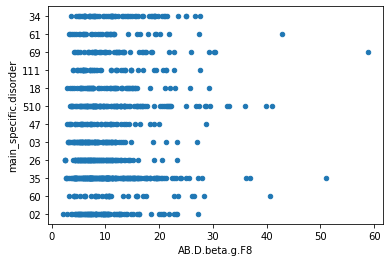

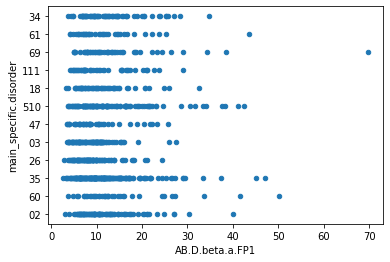

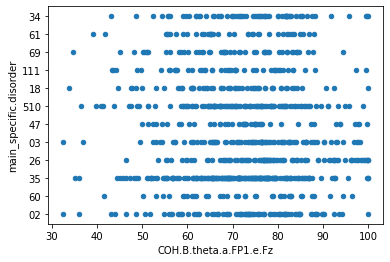

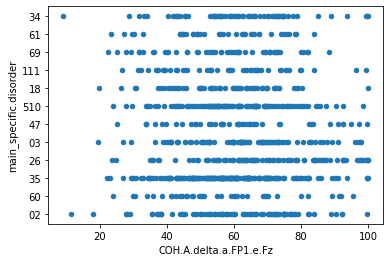

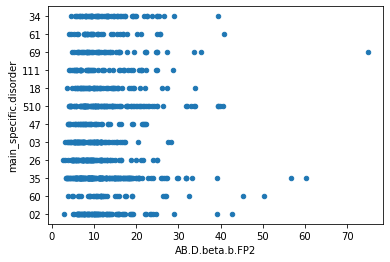

...

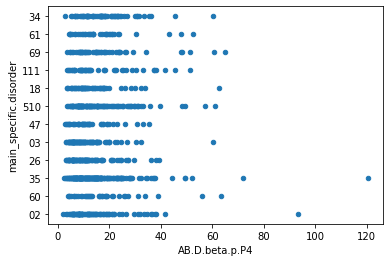

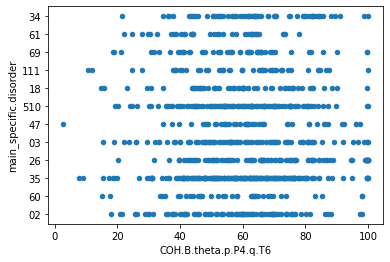

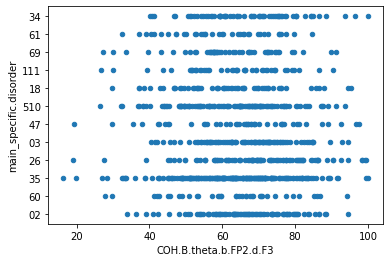

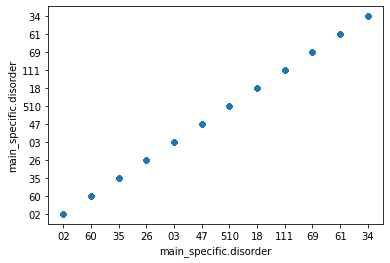

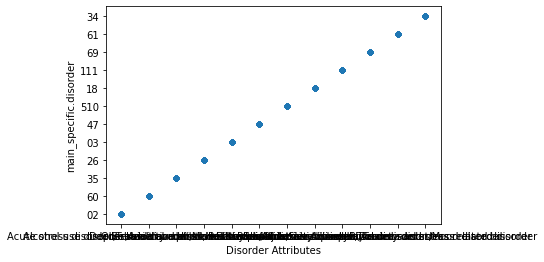

In [216]:
for col in allColumns:
    newData.plot.scatter(x=col, y="main_specific.disorder")

There are some outlier being display in these scatter plots. The beta signals are usually
on the low while alpha is on the high end like AB.D.beta.f.F4. Theta and delta seems to fit in the middle.


In [222]:
newData.loc[newData["main_specific.disorder"]=="69","Disorder Attributes"].value_counts()

Posttraumatic stress disorder,Trauma and stress related disorder    52
Name: Disorder Attributes, dtype: int64

In [ ]:
Some mental disease produces more signal than otther during certain signals. for example, there is a higher concentration of 

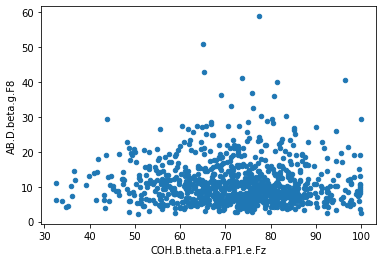

In [155]:
newData.plot.scatter(x="COH.B.theta.a.FP1.e.Fz", y="AB.D.beta.g.F8")

AB.D.beta.g.F8


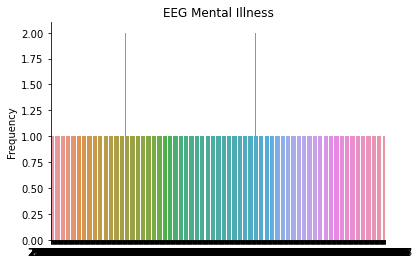

AB.D.beta.a.FP1


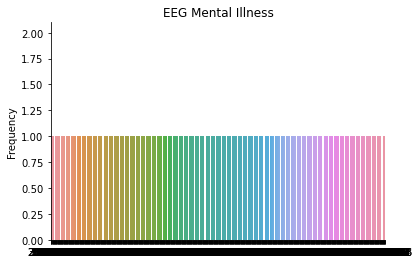

COH.B.theta.a.FP1.e.Fz


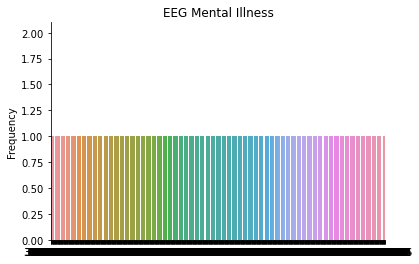

COH.A.delta.a.FP1.e.Fz


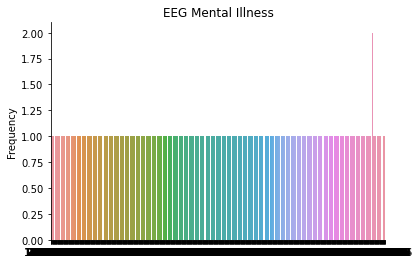

AB.D.beta.b.FP2


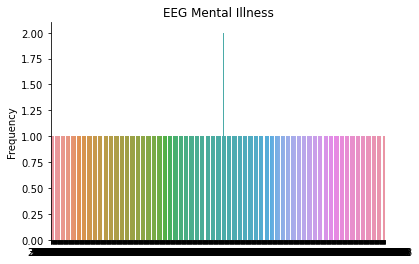

AB.D.beta.m.T5


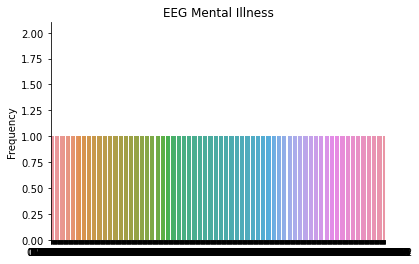

COH.C.alpha.b.FP2.e.Fz


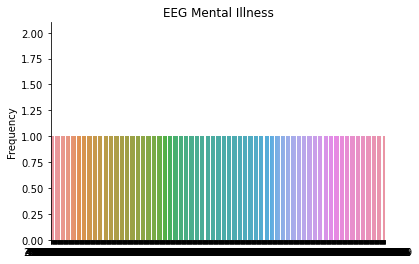

AB.D.beta.f.F4


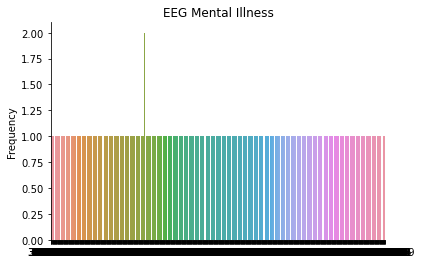

AB.A.delta.q.T6


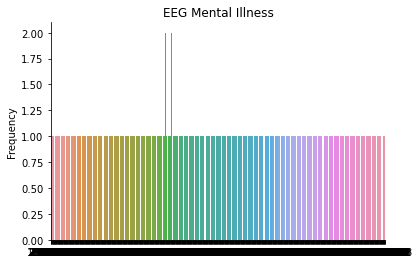

COH.B.theta.b.FP2.e.Fz


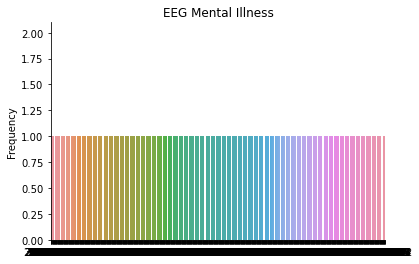

COH.A.delta.b.FP2.e.Fz


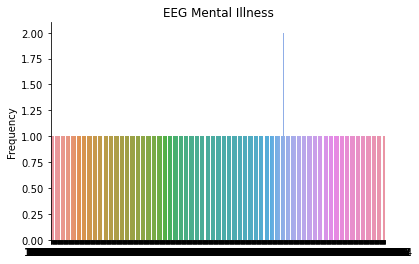

AB.A.delta.r.O1


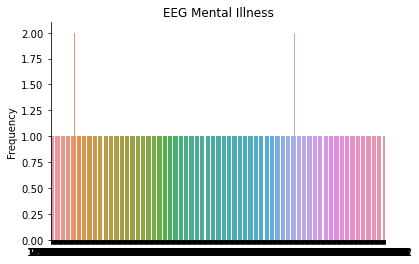

COH.A.delta.m.T5.n.P3


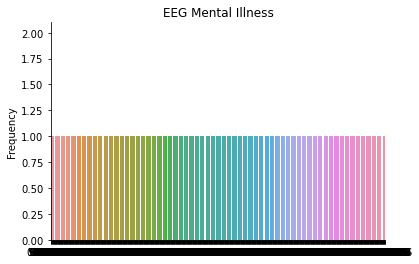

COH.C.alpha.a.FP1.e.Fz


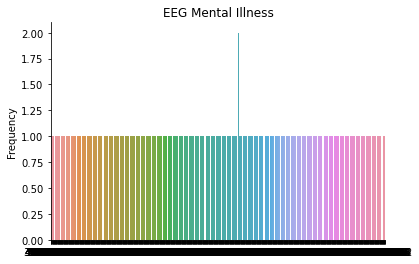

AB.D.beta.n.P3


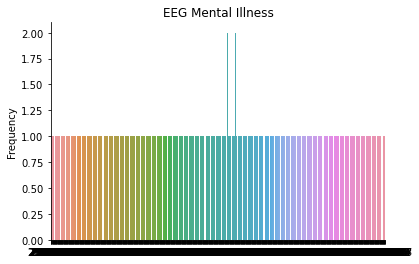

AB.D.beta.d.F3


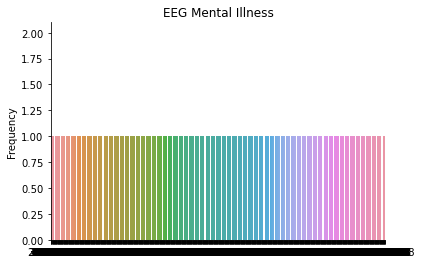

AB.D.beta.q.T6


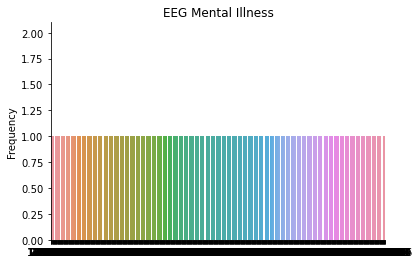

COH.B.theta.m.T5.n.P3


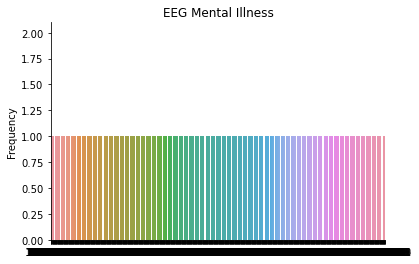

AB.D.beta.k.C4


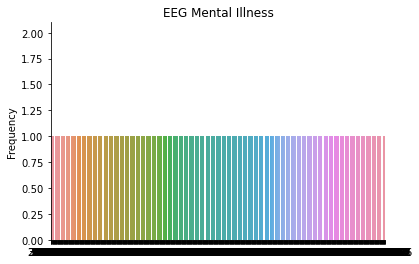

COH.A.delta.b.FP2.d.F3


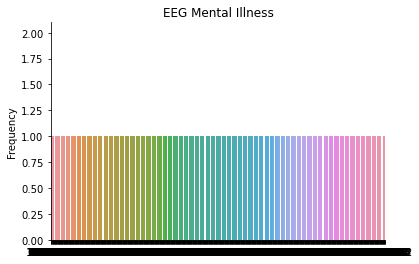

AB.D.beta.e.Fz


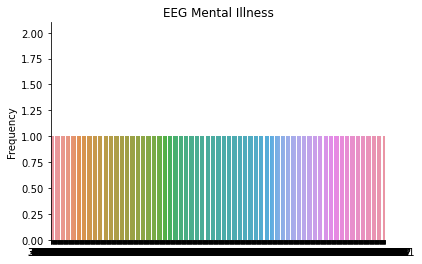

AB.D.beta.c.F7


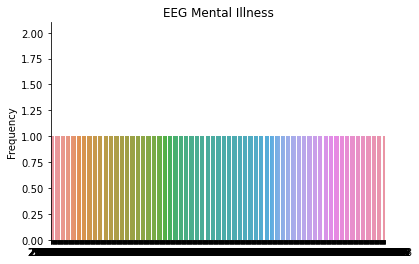

COH.B.theta.a.FP1.f.F4


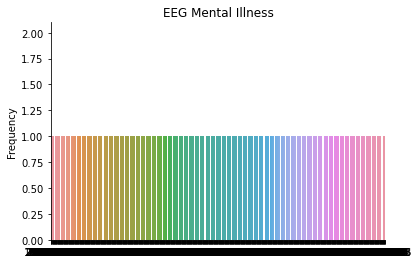

COH.A.delta.a.FP1.b.FP2


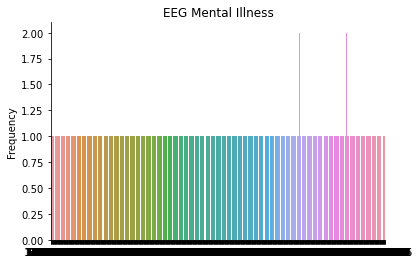

AB.D.beta.i.C3


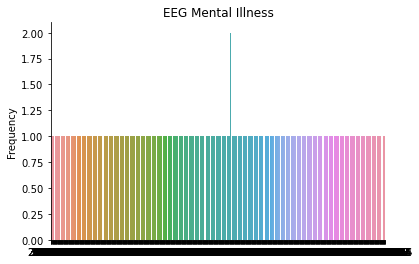

COH.C.alpha.b.FP2.d.F3


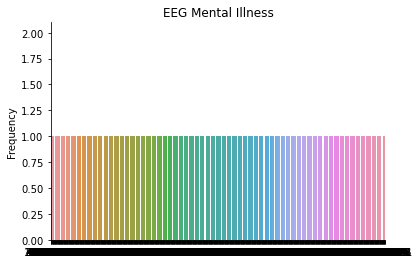

COH.A.delta.p.P4.q.T6


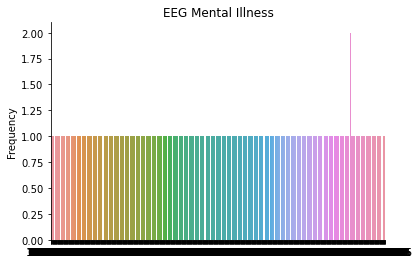

AB.D.beta.p.P4


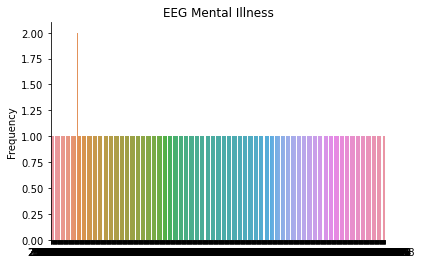

COH.B.theta.p.P4.q.T6


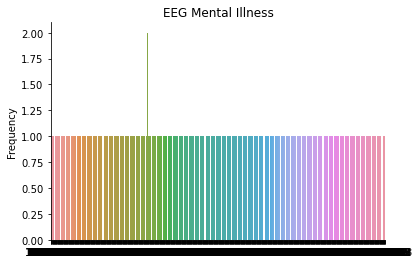

COH.B.theta.b.FP2.d.F3


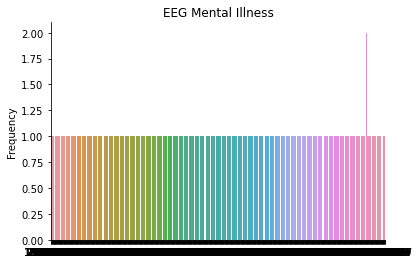

main_specific.disorder


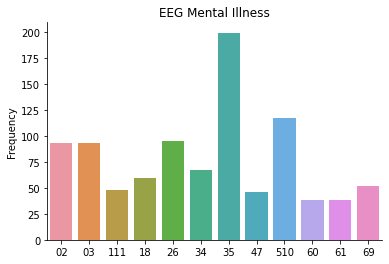

Disorder Attributes


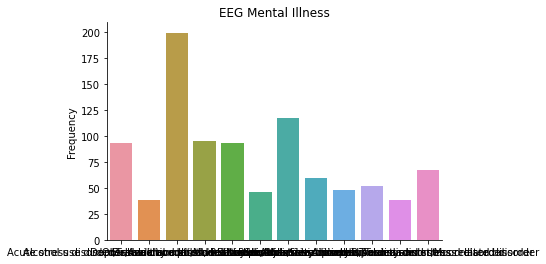

In [184]:
for col in allColumns:
    print(col)


    sns.countplot(data=newData,
                  x=col)
    plt.xlabel('')
    plt.ylabel('Frequency')
    plt.title('EEG Mental Illness')
    sns.despine()
    plt.show()

In [233]:
newData.loc[newData["main_specific.disorder"]=="111","Disorder Attributes"].value_counts()

Social anxiety disorder,Anxiety disorder    48
Name: Disorder Attributes, dtype: int64

In [231]:
newData["Disorder Attributes"].min()

'Acute stress disorder,Trauma and stress related disorder'

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000017922878160>,
      dtype=object)

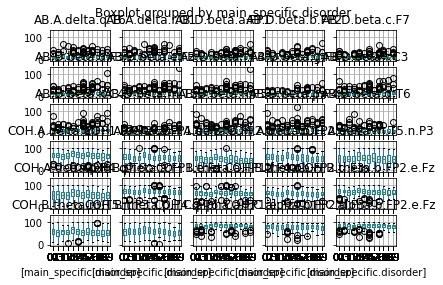

In [175]:
newData.boxplot(by=["main_specific.disorder"])

AB.D.beta.g.F8


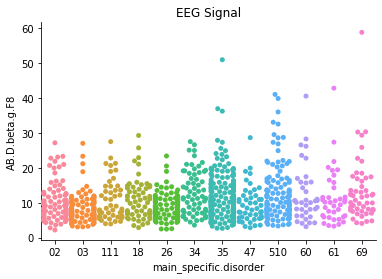

AB.D.beta.a.FP1


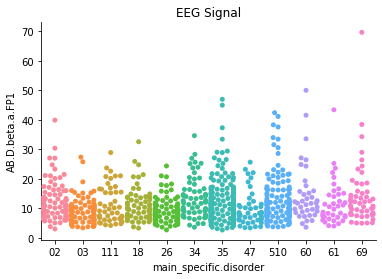

COH.B.theta.a.FP1.e.Fz


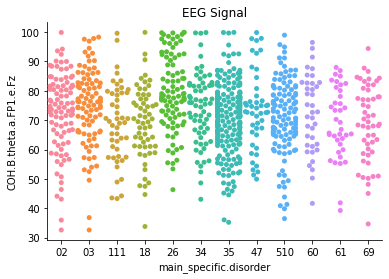

COH.A.delta.a.FP1.e.Fz


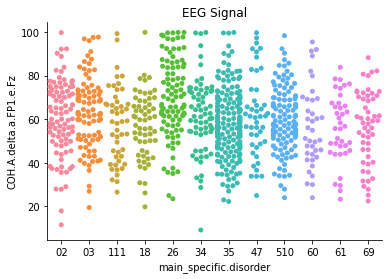

AB.D.beta.b.FP2


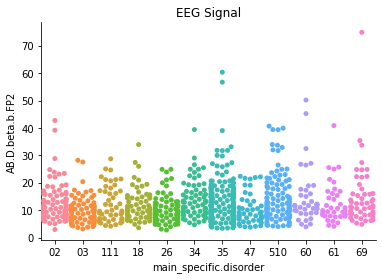

AB.D.beta.m.T5


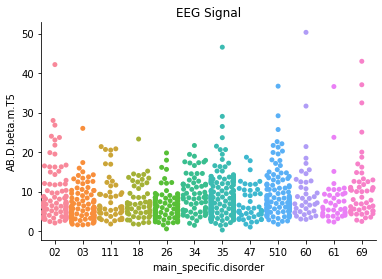

COH.C.alpha.b.FP2.e.Fz


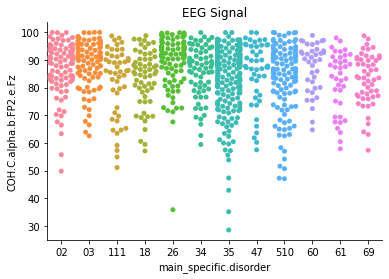

AB.D.beta.f.F4


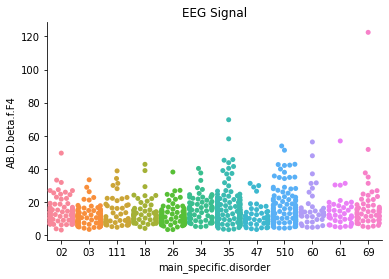

AB.A.delta.q.T6


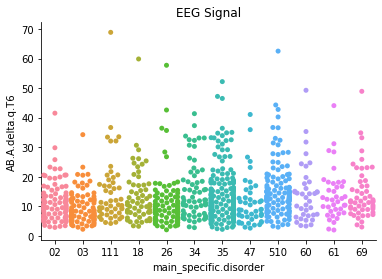

COH.B.theta.b.FP2.e.Fz


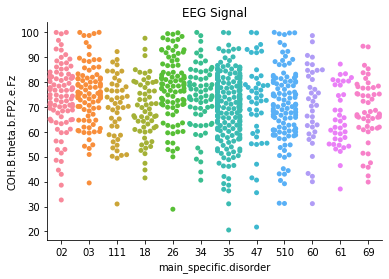

COH.A.delta.b.FP2.e.Fz


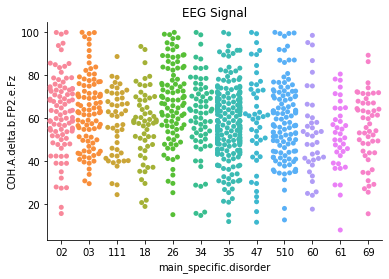

AB.A.delta.r.O1


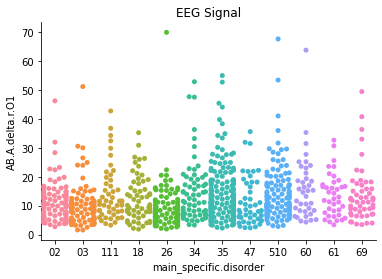

COH.A.delta.m.T5.n.P3


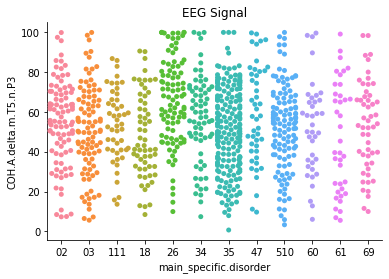

COH.C.alpha.a.FP1.e.Fz


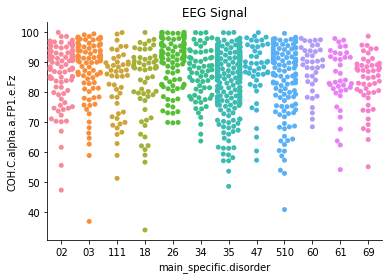

AB.D.beta.n.P3


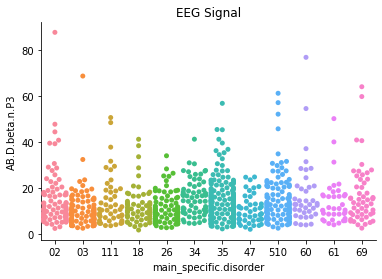

AB.D.beta.d.F3


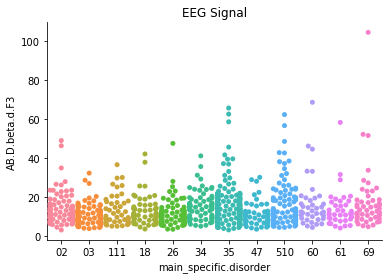

AB.D.beta.q.T6


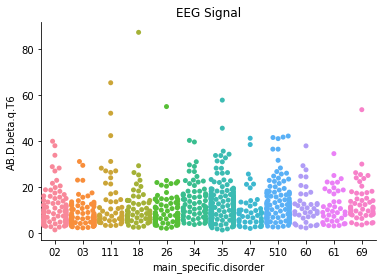

COH.B.theta.m.T5.n.P3


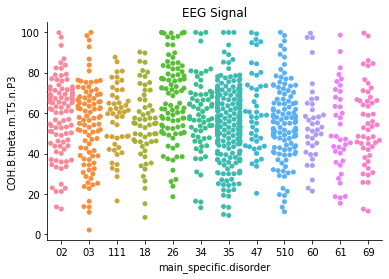

AB.D.beta.k.C4


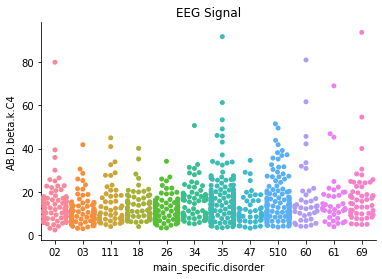

COH.A.delta.b.FP2.d.F3


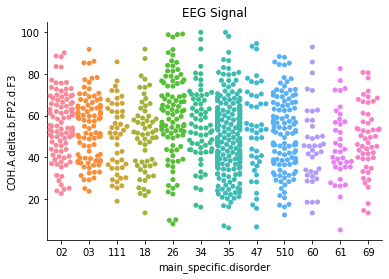

AB.D.beta.e.Fz


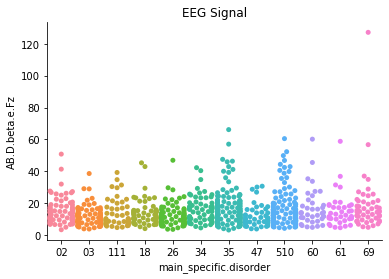

AB.D.beta.c.F7


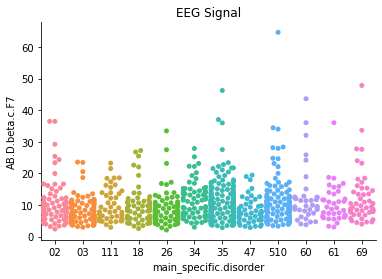

COH.B.theta.a.FP1.f.F4


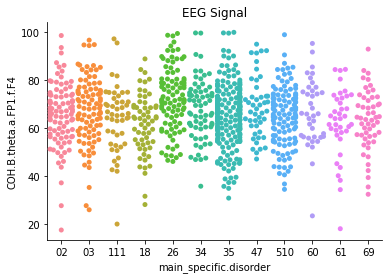

COH.A.delta.a.FP1.b.FP2


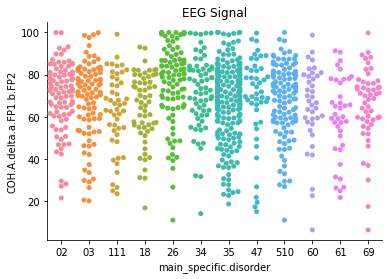

AB.D.beta.i.C3


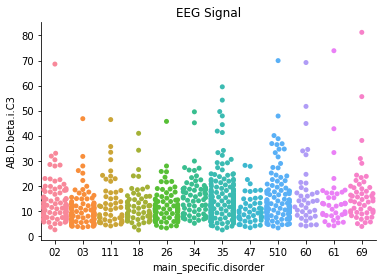

COH.C.alpha.b.FP2.d.F3


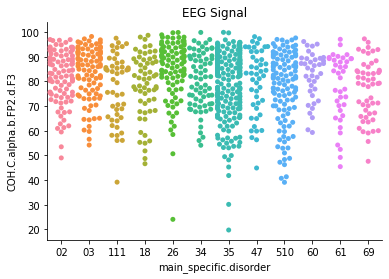

COH.A.delta.p.P4.q.T6


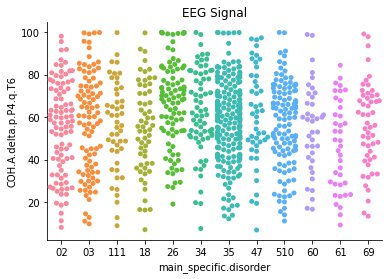

AB.D.beta.p.P4


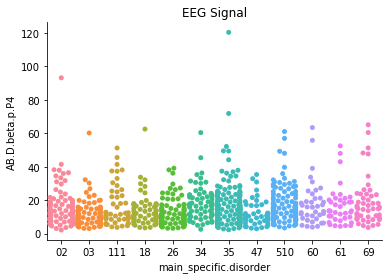

COH.B.theta.p.P4.q.T6


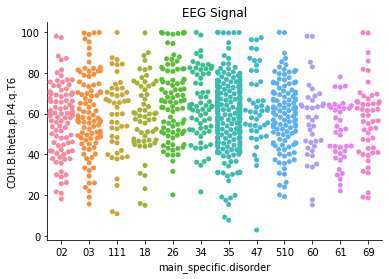

COH.B.theta.b.FP2.d.F3


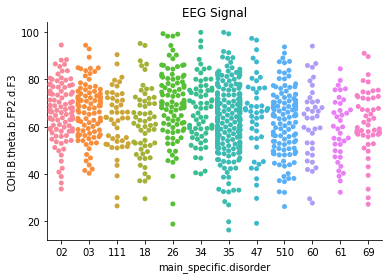

main_specific.disorder


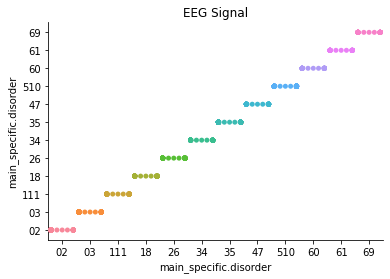

Disorder Attributes


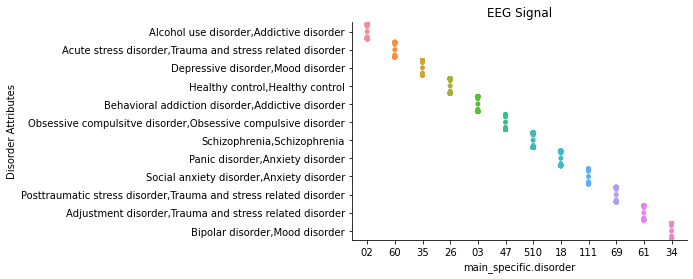

In [223]:
for col in allColumns:
    print(col)
    sns.swarmplot(data=newData,
                x='main_specific.disorder',
                y=col)
    plt.xlabel('main_specific.disorder')
    plt.ylabel(col)
    plt.title("EEG Signal")
    sns.despine()

    plt.show()

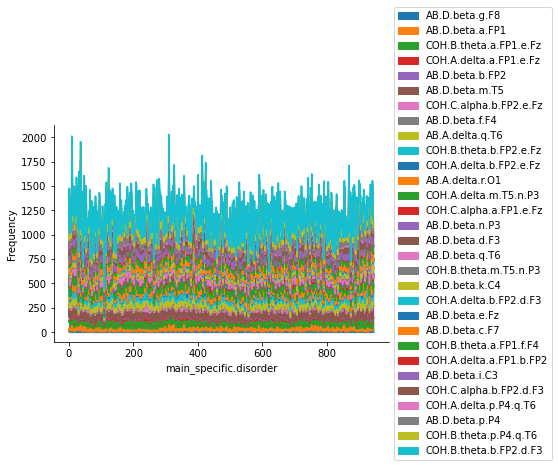

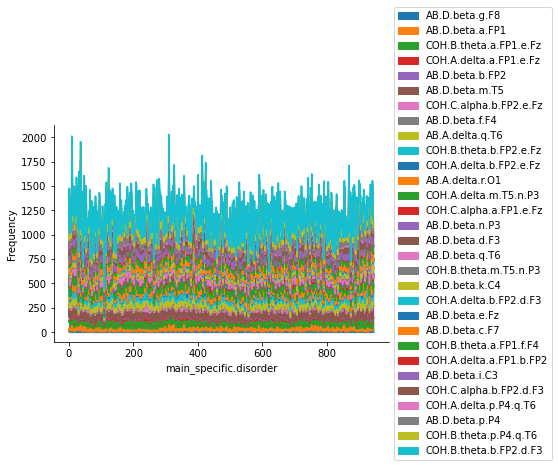

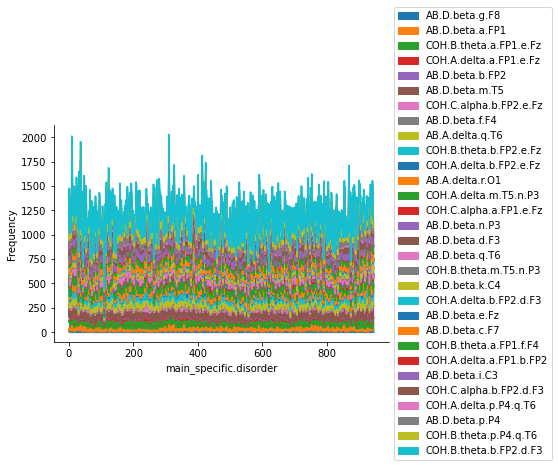

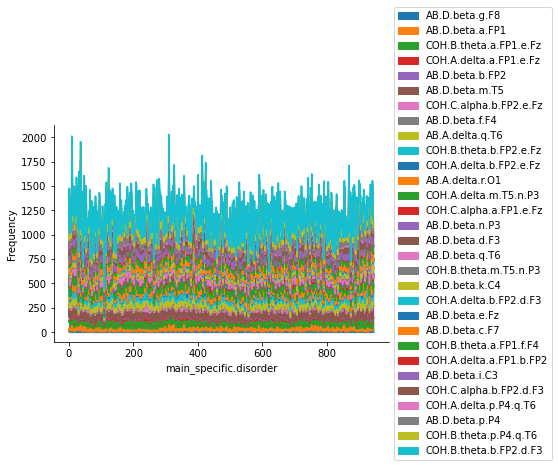

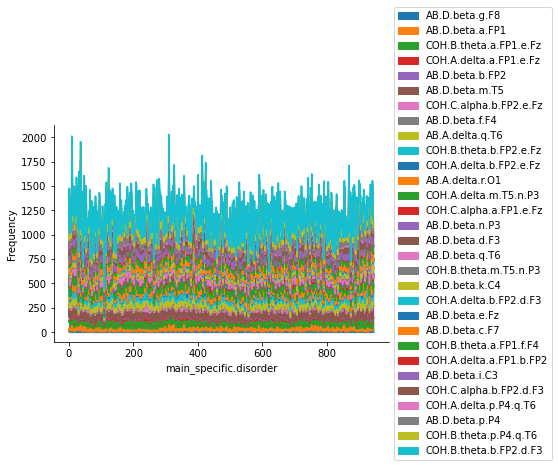

...

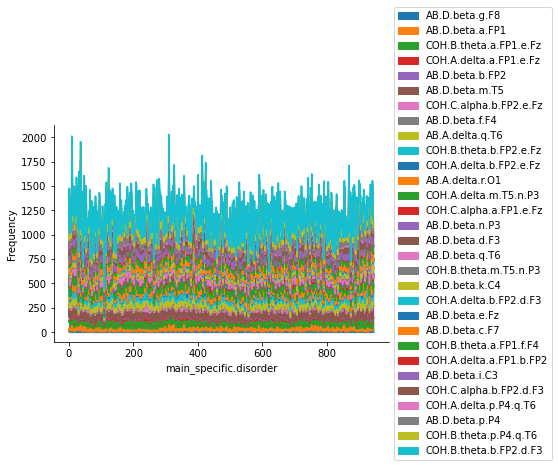

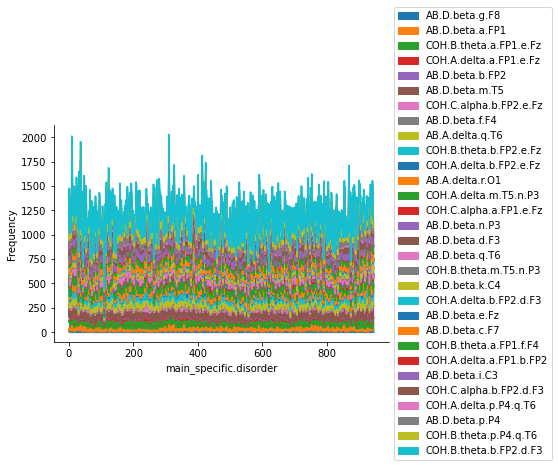

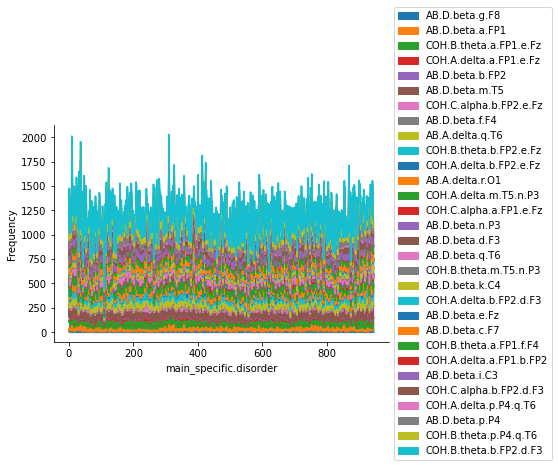

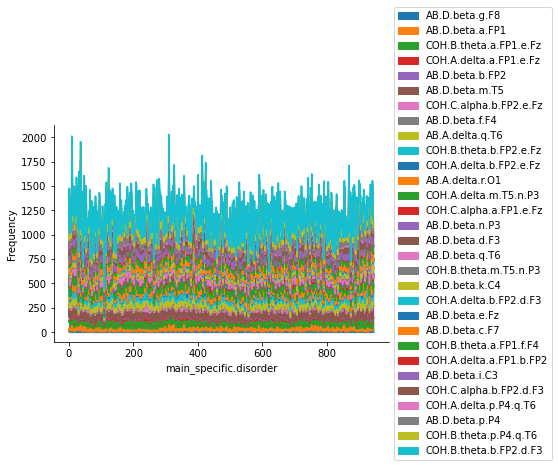

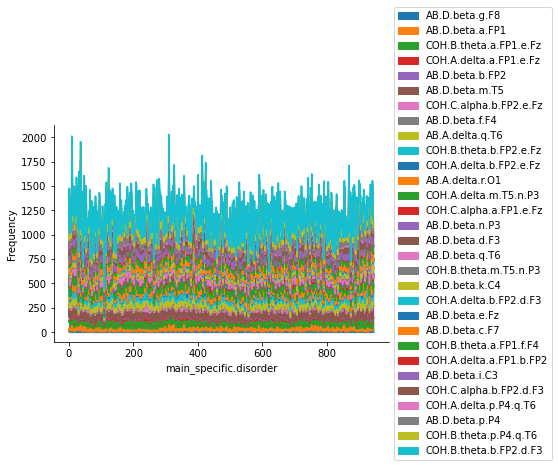

In [194]:
for col in allColumns:
    

    newData.plot.area()
    plt.xlabel('main_specific.disorder')
    plt.ylabel('Frequency')
    sns.despine()
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.savefig('month breakdown')
    plt.show()

No handles with labels found to put in legend.


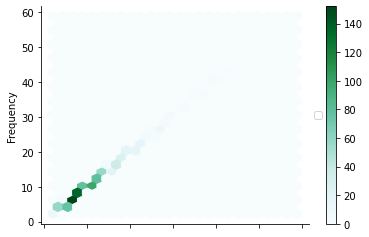

No handles with labels found to put in legend.


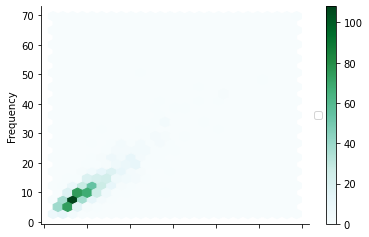

No handles with labels found to put in legend.


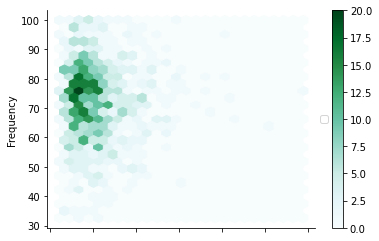

No handles with labels found to put in legend.


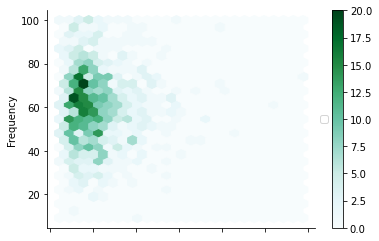

No handles with labels found to put in legend.


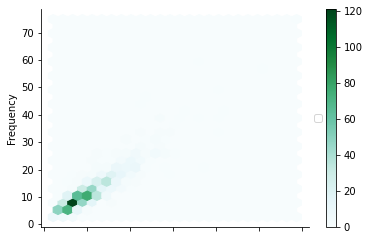

No handles with labels found to put in legend.


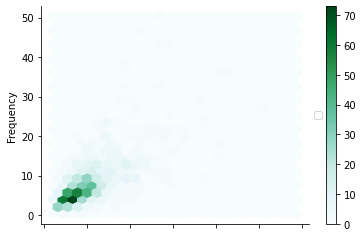

No handles with labels found to put in legend.


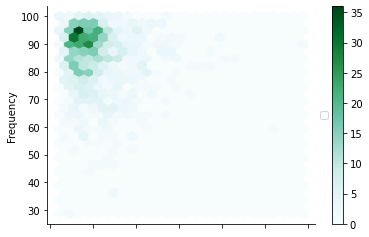

No handles with labels found to put in legend.


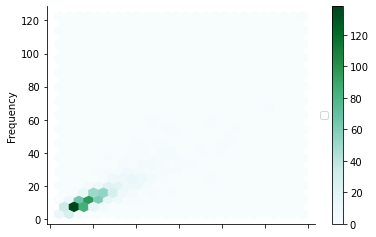

No handles with labels found to put in legend.


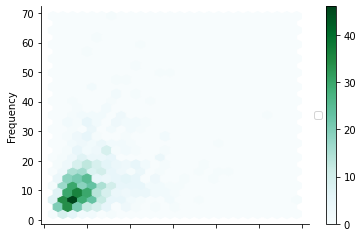

No handles with labels found to put in legend.


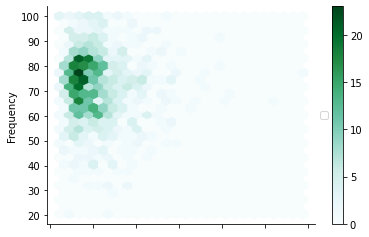

No handles with labels found to put in legend.


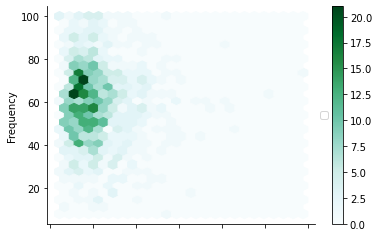

No handles with labels found to put in legend.


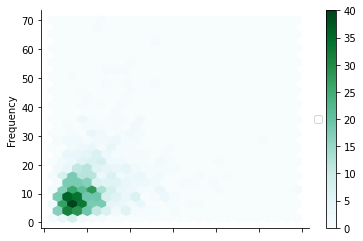

No handles with labels found to put in legend.


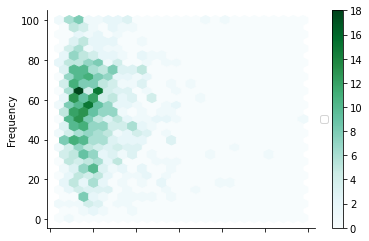

No handles with labels found to put in legend.


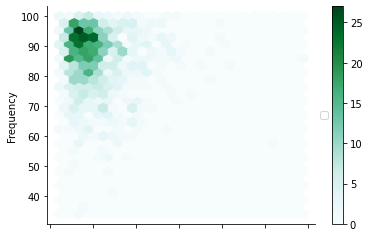

No handles with labels found to put in legend.


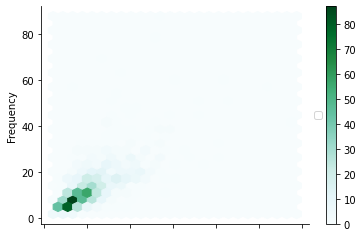

No handles with labels found to put in legend.


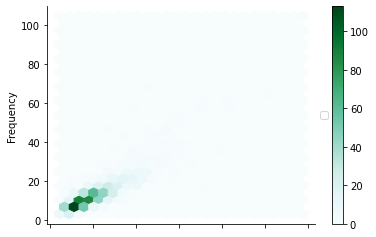

No handles with labels found to put in legend.


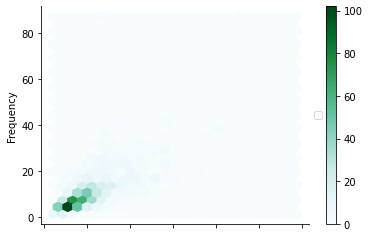

No handles with labels found to put in legend.


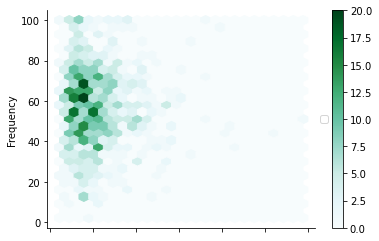

No handles with labels found to put in legend.


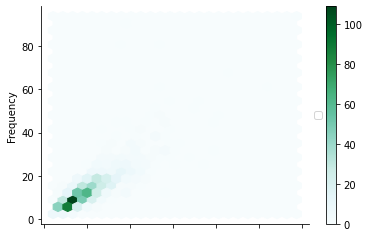

No handles with labels found to put in legend.


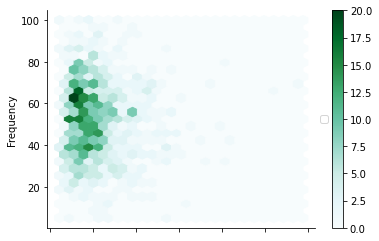

No handles with labels found to put in legend.


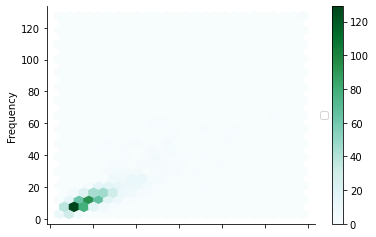

No handles with labels found to put in legend.


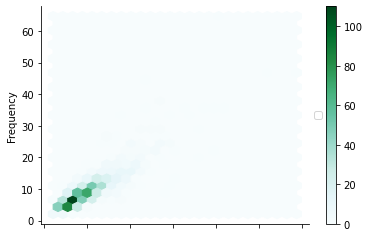

No handles with labels found to put in legend.


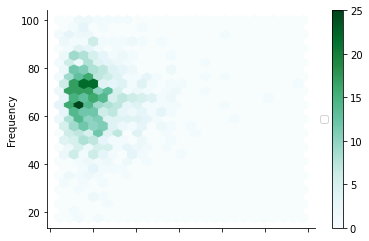

No handles with labels found to put in legend.


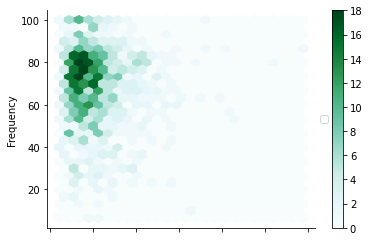

No handles with labels found to put in legend.


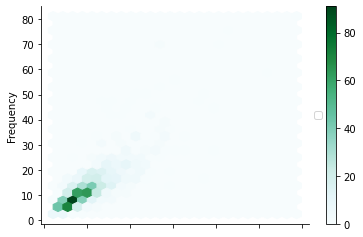

No handles with labels found to put in legend.


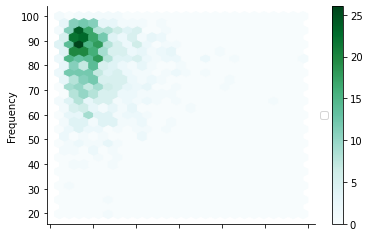

No handles with labels found to put in legend.


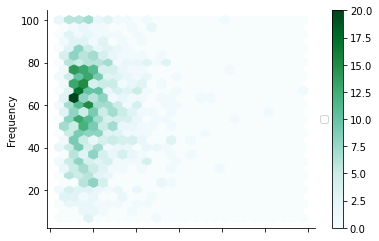

No handles with labels found to put in legend.


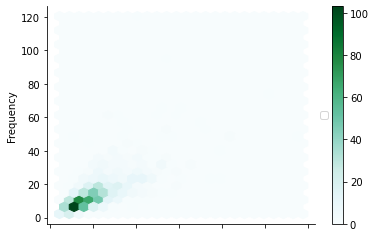

No handles with labels found to put in legend.


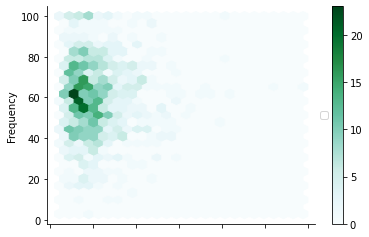

No handles with labels found to put in legend.


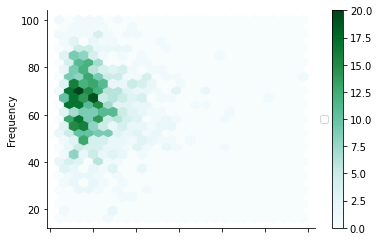

ValueError: hexbin requires y column to be numeric

In [212]:
d="main_specific.disorder"
for col in allColumns:
    

    newData.plot.hexbin(x="AB.D.beta.g.F8",y=col, gridsize=25);
    plt.xlabel('main_specific.disorder')
    plt.ylabel('Frequency')
    sns.despine()
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.savefig('month breakdown')
    plt.show()

In [201]:
len(allColumns)

32

In [211]:
newData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 945 entries, 0 to 944
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AB.D.beta.g.F8           945 non-null    float64
 1   AB.D.beta.a.FP1          945 non-null    float64
 2   COH.B.theta.a.FP1.e.Fz   945 non-null    float64
 3   COH.A.delta.a.FP1.e.Fz   945 non-null    float64
 4   AB.D.beta.b.FP2          945 non-null    float64
 5   AB.D.beta.m.T5           945 non-null    float64
 6   COH.C.alpha.b.FP2.e.Fz   945 non-null    float64
 7   AB.D.beta.f.F4           945 non-null    float64
 8   AB.A.delta.q.T6          945 non-null    float64
 9   COH.B.theta.b.FP2.e.Fz   945 non-null    float64
 10  COH.A.delta.b.FP2.e.Fz   945 non-null    float64
 11  AB.A.delta.r.O1          945 non-null    float64
 12  COH.A.delta.m.T5.n.P3    945 non-null    float64
 13  COH.C.alpha.a.FP1.e.Fz   945 non-null    float64
 14  AB.D.beta.n.P3           9

<ipython-input-225-def43e322720>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrmat = newData.corr()


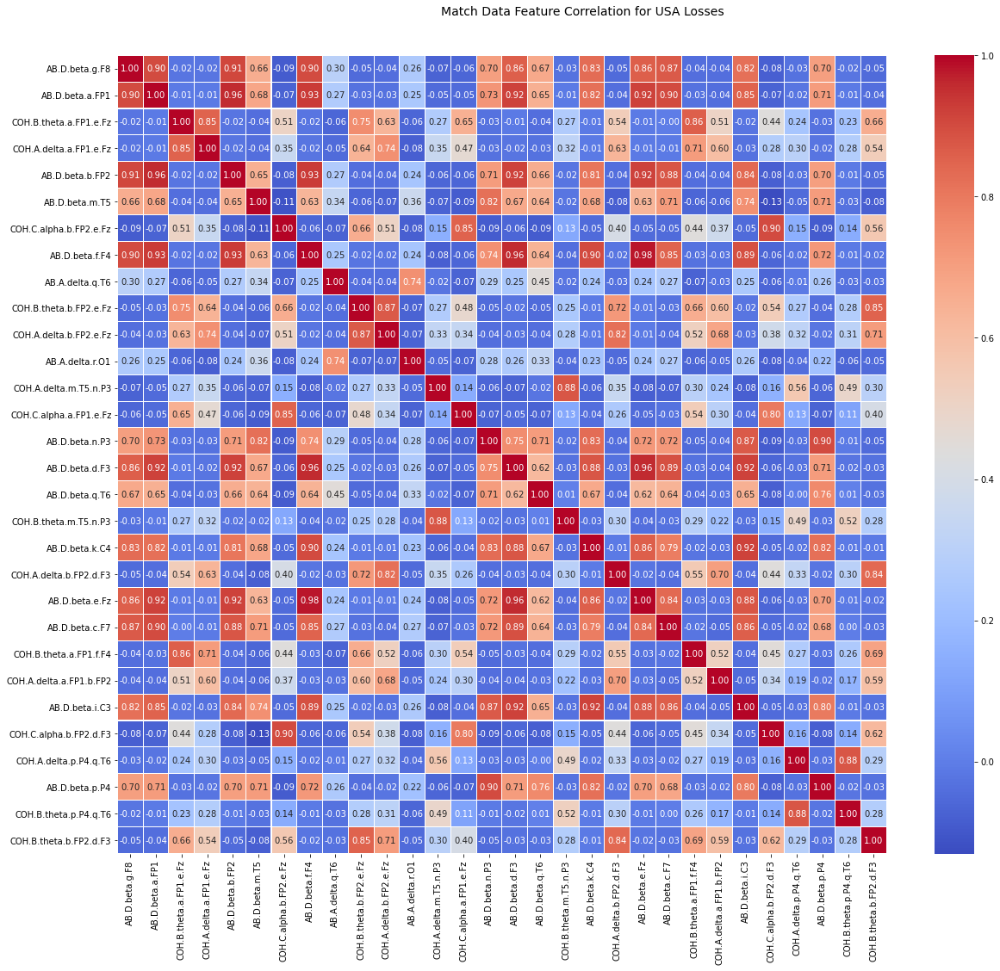

In [225]:
corrmat = newData.corr()
f, ax = plt.subplots(figsize=(20, 16))
hm = sns.heatmap(round(corrmat,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Match Data Feature Correlation for USA Losses', fontsize=14)

Ab.D.beta.g.F8 has high correlation with Ab.D.beta.a.FP1 and Ab.D.beta.b.FP2
THis is not surprising because both are beta signals. Also  
there is a no high correlation with other signal delta, theta, or alpha.  
Theta have correlation with Delta. For example, COH.B.theta.a.FP1.e.Fz and COH.A.delta.a.FP1.e.Fz 
has a correlation of 0.85. This is interesting because it two different signal

Most illness seems to have similar brain signals. So illness has bigger range for their, but that
it. There alot more signal for 35(depressive mood disorder) than other disorders. Schizophrenia is also rank 
higher than other disease. Acute stress disorder,Trauma and stress related disorder is the less common. 35(depressive mood disorder) has much
lower signals in COH.C.alpha.b.FP2.e.Fz than other mental disease. It also have the highest signal in AB.D.beta.f.F4
111(Social anxiety disorder,Anxiety disorder) has outliers in signal AB.A.delta.q.T6 that is much higher than other mental disorder. All mental disease has similair range
in signal COH.A.delta.m.T5.n.P3. 510(Schizophrenia) has outlier and the highest value in AB.D.beta.c.F7. 35(depressive mood disorder) have some high signal, but not the highest in 
signal AB.D.beta.i.C3. What interesting is that there a bout seven points that ranks high in the chart. So it not outlier. It has a higher probailty 
of having higher signal value in AB.D.beta.i.C3.